# 2. Exploratory Data Analysis (EDA)
**Goal:** This EDA investigates the relationships between meteorological variables and air quality metrics to identify pollution patterns, weather temporal regimes or clusters.

This notebook, therefore, focuses on:
- Numerical/categorical EDA
- Relationships between features and target
- A robust plan for data prep, modelling, assessment, and next steps

### Data Profiling
- Automated data profiling was first used during the exploratory phase to identify data quality issues, distributional characteristics, and potential analytical risks. 
- Identified issues were then addressed using explicit statistical and programmatic methods.




### 2.1 Air Quality data Profiling using Y-Data Profiling.
Crucial for how it automates and standardises the generation of detailed reports, complete with statistics and visualisations.
Therefore, pinpointing areas for further action.

In [1]:
# import package
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt

from scipy.stats import chi2_contingency
from sklearn.preprocessing import StandardScaler
from ydata_profiling import ProfileReport

In [2]:
df = pd.read_csv("../Raw_data/air_quality_df.csv")

In [2]:
# Load the dataframe
df = pd.read_csv("../Raw_data/air_quality_df.csv")
profile = ProfileReport(df, title="Air Quality Profiling")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|                                                    | 0/13 [00:00<?, ?it/s]
100%|███████████████████████████████████████████| 13/13 [00:00<00:00, 37.20it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 2.1.1 High level data Overview

In [14]:
# Loading the dataset
df = pd.read_csv("../Raw_data/air_quality_df.csv")
df.shape

(8640, 13)

In [15]:
# Brief view of column names
df.head(3)


,date,pm10,pm2_5,carbon_monoxide,sulphur_dioxide,ozone,us_aqi,carbon_dioxide,nitrogen_dioxide,city,country,lat,lon
0,2025-11-07 00:00:00+00:00,12.3,11.8,252.0,15.1,57.0,103.125000,466.0,29.5,Los Angeles,US,34.0522,-118.2437
1,2025-11-07 01:00:00+00:00,13.5,12.6,307.0,13.5,43.0,102.239586,472.0,38.9,Los Angeles,US,34.0522,-118.2437
2,2025-11-07 02:00:00+00:00,14.4,13.8,388.0,11.4,24.0,101.406240,482.0,51.9,Los Angeles,US,34.0522,-118.2437


In [5]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
date,8640,1440,2026-01-05 07:00:00+00:00,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pm10,8640.0,NaN,NaN,NaN,12.678646,10.682718,0.1,5.3,10.25,16.5,81.7
pm2_5,8640.0,NaN,NaN,NaN,10.582569,10.841096,0.1,3.3,6.9,13.7,81.3
carbon_monoxide,8640.0,NaN,NaN,NaN,259.442708,162.691291,98.0,166.0,216.0,289.25,1644.0
sulphur_dioxide,8640.0,NaN,NaN,NaN,5.03081,5.470364,0.0,1.7,3.3,6.6,39.2
ozone,8640.0,NaN,NaN,NaN,51.391551,26.515504,0.0,33.0,55.0,72.0,109.0
us_aqi,8640.0,NaN,NaN,NaN,45.847025,21.364688,13.59375,32.256945,39.250927,53.05851,149.85416
carbon_dioxide,8640.0,NaN,NaN,NaN,464.851273,34.445496,438.0,446.0,454.0,467.0,733.0
nitrogen_dioxide,8640.0,NaN,NaN,NaN,21.148762,21.249639,0.1,5.5,14.1,30.4,105.2
city,8640,6,Los Angeles,1440,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Insights
#### Pollution Levels (Health Context):
* pm2_5 mean: 10.58 WHO annual limit is 5 (WHO limit: 5 µg/m³ annual mean)
* Still doesn't show missing values
* Skewness Check:
* 
    ##### Right_skewed': pm10, pm2_5, nitrogen dioxide and sulphur_dioxide.
    ##### left_skewed': ozone and carbon_monoxide
    ##### symmetric': carbon_dioxide


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8640 entries, 0 to 8639
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   date              8640 non-null   object 
 1   pm10              8640 non-null   float64
 2   pm2_5             8640 non-null   float64
 3   carbon_monoxide   8640 non-null   float64
 4   sulphur_dioxide   8640 non-null   float64
 5   ozone             8640 non-null   float64
 6   us_aqi            8640 non-null   float64
 7   carbon_dioxide    8640 non-null   float64
 8   nitrogen_dioxide  8640 non-null   float64
 9   city              8640 non-null   object 
 10  country           8640 non-null   object 
 11  lat               8640 non-null   float64
 12  lon               8640 non-null   float64
dtypes: float64(10), object(3)
memory usage: 877.6+ KB


In [7]:
df.nunique().sort_values()

country                1
lon                    6
city                   6
lat                    6
ozone                104
carbon_dioxide       226
sulphur_dioxide      319
pm2_5                536
pm10                 544
carbon_monoxide      753
nitrogen_dioxide     871
date                1440
us_aqi              4404
dtype: int64

In [8]:
# Printing every distinct value in all columns
for column in df.columns:
    print(f"column: {column}", df[column].unique())

column: date ['2025-11-07 00:00:00+00:00' '2025-11-07 01:00:00+00:00'
 '2025-11-07 02:00:00+00:00' ... '2026-01-05 21:00:00+00:00'
 '2026-01-05 22:00:00+00:00' '2026-01-05 23:00:00+00:00']
column: pm10 [12.3 13.5 14.4 17.5 19.7 22.9 31.7 36.1 35.6 32.6 29.9 27.6 24.9 23.5
 24.1 26.3 28.2 25.5 22.8 20.9 19.4 17.8 16.1 14.5 17.7 19.5 21.5 23.9
 29.3 38.3 42.6 41.3 38.  32.  27.1 20.4 18.4 18.3 20.7 24.3 21.8 19.1
 19.  19.9 20.3 25.8 29.1 33.4 36.  40.4 43.8 47.5 50.8 53.  53.4 49.8
 42.1 26.9 22.2 22.6 25.1 23.3 22.4 21.4 21.2 27.2 26.7 25.6 25.4 28.9
 35.9 31.  27.7 21.1 18.2 16.9 17.4 19.8 26.5 23.7 22.5 21.6 22.7 25.
 34.5 39.5 41.1 37.7 29.6 24.7 20.5 23.4 26.6 28.3 29.  30.  32.2 35.3
 36.3 35.7 32.9 31.9 45.6 44.8 47.1 54.  58.7 58.8 48.1 32.4 29.5 27.3
 26.4 34.1 45.1 45.4 38.6 37.  41.4 46.8 47.3 44.6 41.7 39.  36.2 42.3
 45.3 32.7 26.1 18.5 17.6 18.7 27.9 30.9 26.8 18.  16.8 15.3 13.6 13.3
 14.2 12.2 11.4 11.8 12.  11.3 11.7 12.6 14.9 15.6 14.8 13.9 13.2 13.
 11.   8.8  7.   6.

#### Insights:
* No evidence of: Unit inconsistency, Type mismatch and Impossible values

### 2.1.2 Numeric EDA
* Exploring distributions and basic signals

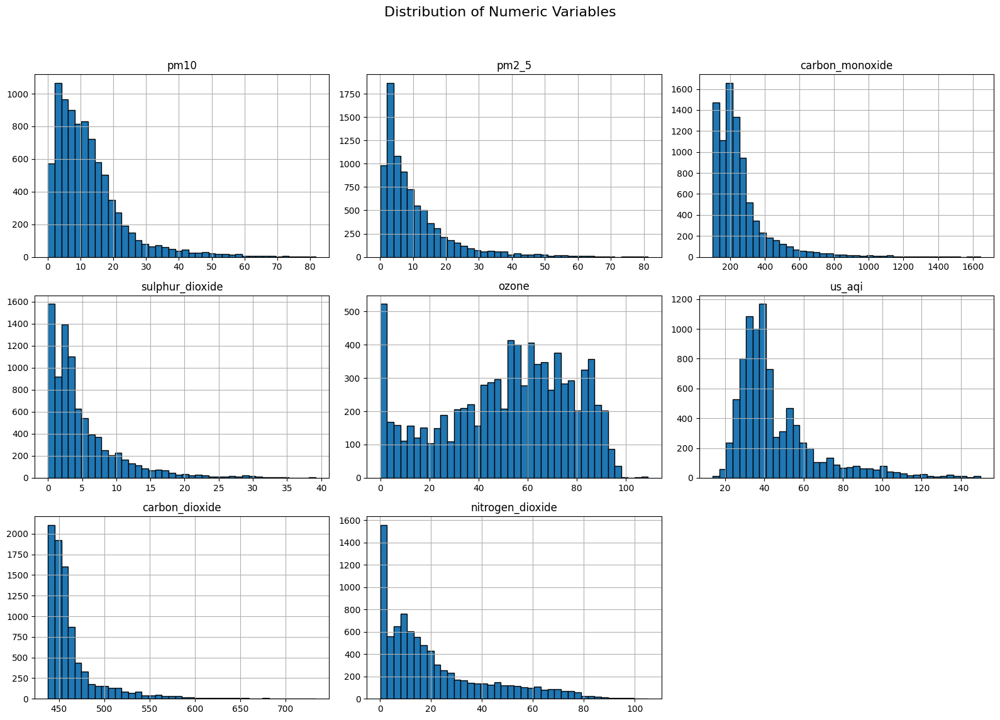

In [51]:

# Select numeric columns
numeric_cols = [
    'pm10',
    'pm2_5', 
    'carbon_monoxide',
    'sulphur_dioxide',
    'ozone',
    'us_aqi',
    'carbon_dioxide',
    'nitrogen_dioxide'
]

# Plot histograms
df[numeric_cols].hist(
    bins=40,
    figsize=(16, 12),
    edgecolor="black"
)

plt.suptitle("Distribution of Numeric Variables", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()



### 2.1.3 Categorical EDA
* This section inspects categorical values

In [3]:
cat_cols = df.select_dtypes(include=["object"]).columns.tolist()
cat_cols

['date', 'city', 'country']

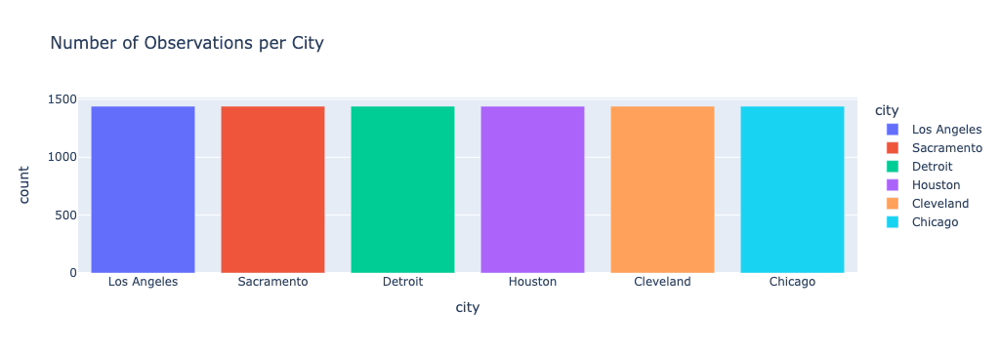

In [4]:
import plotly.express as px

city_counts = df["city"].value_counts().reset_index()
city_counts.columns = ["city", "count"]

fig = px.bar(
    city_counts,
    x="city",
    y="count",
    title="Number of Observations per City",
    color="city"
)

fig.show()


### 2.2 Weather forecast data profiling using Y-Profilling

In [2]:
import pandas as pd
from ydata_profiling import ProfileReport

df = pd.read_csv("../Raw_data/weather_df.csv")
profile = ProfileReport(df, title="Weather forecast data Quality Profiling")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████| 10/10 [00:00<00:00, 437.48it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
air_quality_df.to_csv("../Raw_data/air_quality_df.csv", index=False)
# Save weather data
weather_df.to_csv("../Raw_data/weather_df.csv", index=False)